# Find Path Descriptors using Z space of Autoencoder

Autoencoder are good at:
- **dimensionality reduction** for data visualization
- **data denoising** for robust feature learning

Dimensions of Input space= n x 100 x 3
Dimensions of Latent space (z-space)= z

# Enhance reproducability of results

In [1]:
#%env PYTHONHASHSEED=0 
#%env CUDA_VISIBLE_DEVICES=""

In [2]:
import numpy as np
import tensorflow as tf
import random

np.random.seed(1)
random.seed(1)
tf.set_random_seed(1)

config = tf.ConfigProto(intra_op_parallelism_threads=1,inter_op_parallelism_threads=1)
from keras import backend as K
sess = tf.Session(graph=tf.get_default_graph(), config=config)
K.set_session(sess)

Using TensorFlow backend.


In [3]:
def resetRNG(seed_value):
    random.seed(seed_value)
    np.random.seed(seed_value)
    tf.set_random_seed(seed_value)

# Import .npz Database containing 5SS mechanisms and cplr paths

In [4]:
# Import data offline
import os
current_dir=os.getcwd()
db_path=os.path.join(current_dir,'..','1. DB Preprocessing','norm_database5SS.npz')
db = np.load(db_path)

In [5]:
# Import data on Google CoLab
#from google.colab import files
#uploaded = files.upload()
#db = np.load('norm_database5SS.npz')

In [6]:
print(db.files)
cplr=db['cplrData']
mech=db['mechData']

print(cplr.shape)
print(mech.shape)

['cplrData', 'mechData']
(1453, 100, 3)
(1453, 11, 3)


# Splitting the database in Train/Test dataset

In [7]:
x= cplr

# Split data into training and testing dataset
from sklearn.model_selection import train_test_split
x_train, x_test, _, _ = train_test_split(x, x, test_size=0.2, random_state=1)

# Functions to TRAIN an Autoencoder

In [8]:
from keras.layers import Input, Dense, Flatten, Reshape, SeparableConv1D, concatenate
from keras.models import Model
from keras.layers import LeakyReLU
from keras import regularizers
from keras.callbacks import ModelCheckpoint, EarlyStopping
#from keras import initializers
import keras

In [14]:
# Train same model architecture multiple times since the training process is stochastic

def AE_analysis(AE_model, iterations, x_train, x_test, filename='model'):
    val_loss_list=[]
    best_val_loss=np.inf;
    for i in range(iterations):
        print('Model no. '+str(i+1))
        AE, E = AE_model()
        val_loss, train_data=train_AE(AE, E, x_train, x_test)
        val_loss_list.append(val_loss)
        if best_val_loss>val_loss:
            best_AE=AE
            best_E=E
            best_train_data=train_data
            best_val_loss=val_loss
    
    # PRINT MEAN, VARIANCE and BEST MODEL METRICS
    print(val_loss_list)
    print('Average Validation Loss: '+str(np.mean(val_loss_list)))
    
    # SAVE BEST MODEL
    AEfilename='AE_'+filename+'_val_loss_'+str(best_val_loss)+'.h5'
    AEfilepath=os.path.join('models',AEfilename)
    best_AE.save(AEfilepath)
    
    return best_AE, best_E, best_train_data

In [10]:
def train_AE(autoencoder, encoder, x_train, x_test, epochs=500):
    # TRAINING PHASE
    autoencoder.compile(optimizer='adam', loss='mean_squared_error')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, mode='min',
                                  restore_best_weights=True)
    autoencoder_train=autoencoder.fit(x_train, x_train, epochs=epochs, batch_size=128, 
                                      shuffle=False, validation_data=(x_test, x_test), 
                                      verbose=0, callbacks=[earlyStopping])
    
    # TRAINING DATA
    val_loss = autoencoder_train.history['val_loss']
    f_val_loss=np.round_(val_loss[-1],decimals=4)
    
    return f_val_loss, autoencoder_train

# Functions to VISUALIZE an Autoencoder

In [11]:
def visualize_AE(AE, train_data, x_test):
    # VISUALIZING TRAINING CURVES
    visualize_train_curves(train_data)
    
    # VISUALIZE RECONSTRUCTED CURVES
    reconst_curve = AE.predict(x_test)
    visualize_reconstructed_CplrCurves(x_test, reconst_curve, 20)

    
def visualize_train_curves(train_data):
    loss = train_data.history['loss']
    val_loss = train_data.history['val_loss']
    
    f_loss=np.round_(loss[-1],decimals=4)
    f_val_loss=np.round_(val_loss[-1],decimals=4)
    
    print('Training loss: '+str(f_loss))
    print('Validation loss: '+str(f_val_loss))
    
    epochsRange = range(len(loss))
    plt.figure()
    plt.plot(epochsRange, loss, 'r', label='Training loss')
    plt.plot(epochsRange, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    plt.show()

    
def visualize_reconstructed_CplrCurves(x_test, reconst_curve, n=10, b_spline=False):
    plt.figure(figsize=(3*n, 3))
    for i in range(n):
        ax = plt.subplot(1, n, i + 1, projection='3d')
        if b_spline:
            reconst_curve[i]=b_spline_interpolation(reconst_curve[i], 100)
        plotPath(reconst_curve[i], ax, 2,'r' )
        plotPath(x_test[i], ax, 2)
    plt.tight_layout()
    plt.show()

In [12]:
# Plotting Functions

#%matplotlib inline
%matplotlib notebook
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
from scipy import interpolate


def plotPath(Pts, ax, limit, color = 'gray'):
    xline=Pts[:,0]
    yline=Pts[:,1]
    zline=Pts[:,2]
    ax.plot3D(xline, yline, zline, color)
    ax.auto_scale_xyz([-limit, limit], [-limit, limit], [-limit, limit])

def plotXYZ(center, RotMat, ax):
    C=np.vstack((center,center,center))
    R=RotMat
    r=(1,0,0)
    g=(0,1,0)
    b=(0,0,1)
    ax.quiver(C[:,0], C[:,1], C[:,2], R[:,0], R[:,1], R[:,2],color=(r,g,b,r,r,g,g,b,b))


def b_spline_interpolation(inp_pts, out_n):
    # Fit cubic B-spline to the points
    xp=inp_pts[i,:,0]
    yp=inp_pts[i,:,1]
    zp=inp_pts[i,:,2]
        
    # Check for duplicate points as interpolation routine errors out
    okay = np.where(np.abs(np.diff(xp)) + np.abs(np.diff(yp)) + np.abs(np.diff(zp)) > 0)
    xp = np.r_[xp[okay], xp[-1]]
    yp = np.r_[yp[okay], yp[-1]]
    zp = np.r_[zp[okay], zp[-1]]
    
    tck, u =interpolate.splprep([xp,yp,zp],s=1)
    num_pts=out_n
    u_fine = np.linspace(0,1,num_pts)
    x_f, y_f, z_f = interpolate.splev(u_fine, tck)
    Path_f = np.vstack(([x_100],[y_100],[z_100])).T
    
    return Path_f

# 1. Effect of activation func: Sigmoid vs RELU vs LeakyRELU

First we try to find which activation function might perform better for our usecase i.e. describing 3D coupler paths. Each model is trained 10 times for 200 epochs and the best fit model results are reported. The Training Loss and Validation Loss after training are

| Activation Function | Mean Validation Loss | Best Validation Loss |
|:-------------------:|:--------------------:|:--------------------:|
| Sigmoid             | 0.0122               | 0.0056
| RELU                | 0.0066               | 0.0032
| LeakyRELU           | 0.0063               | 0.0036


## 1.1 Autoencoder Sigmoid activation

Model no. 1
Restoring model weights from the end of the best epoch
Epoch 00114: early stopping
Model no. 2
Restoring model weights from the end of the best epoch
Epoch 00353: early stopping
Model no. 3
Restoring model weights from the end of the best epoch
Epoch 00263: early stopping
Model no. 4
Restoring model weights from the end of the best epoch
Epoch 00218: early stopping
Model no. 5
Restoring model weights from the end of the best epoch
Epoch 00211: early stopping
Model no. 6
Restoring model weights from the end of the best epoch
Epoch 00213: early stopping
Model no. 7
Restoring model weights from the end of the best epoch
Epoch 00203: early stopping
Model no. 8
Restoring model weights from the end of the best epoch
Epoch 00156: early stopping
Model no. 9
Restoring model weights from the end of the best epoch
Epoch 00211: early stopping
Model no. 10
Restoring model weights from the end of the best epoch
Epoch 00170: early stopping
[0.0187, 0.0056, 0.0103, 0.011, 0.0113, 0.0112, 0

<IPython.core.display.Javascript object>


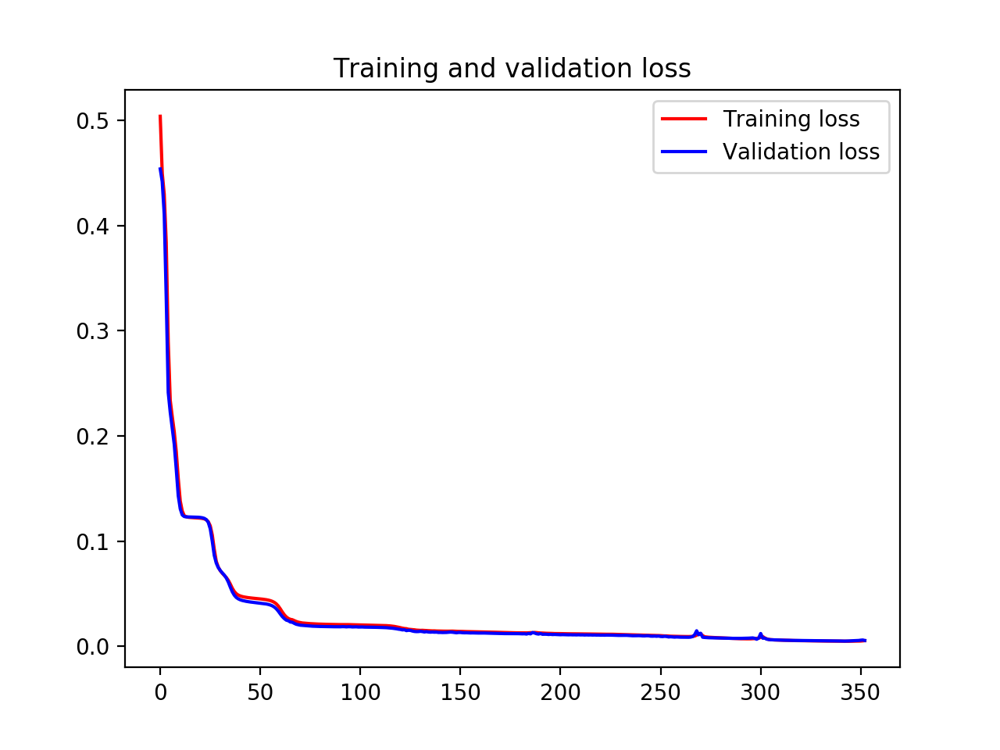

<IPython.core.display.Javascript object>


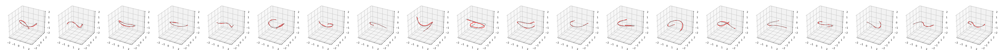

In [15]:
def autoEncoderSig():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(300, activation='sigmoid')(x)
    x=Dense(200, activation='sigmoid')(x)
    encoded=Dense(100, activation='sigmoid')(x)

    # Decoding
    x=Dense(200, activation='sigmoid')(encoded)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
#autoencoderSig, encoderSig=autoEncoderSig()
#testAutoEncoder(autoencoderSig, encoderSig, x_train, x_test, filepath='AE_Sig')

AE,E,train_data =AE_analysis(autoEncoderSig, 10, x_train, x_test, filename='Sig')
visualize_AE(AE, train_data, x_test)

## 1.2 Autoencoder RELU activation

Model no. 1
Restoring model weights from the end of the best epoch
Epoch 00079: early stopping
Model no. 2
Restoring model weights from the end of the best epoch
Epoch 00069: early stopping
Model no. 3
Restoring model weights from the end of the best epoch
Epoch 00051: early stopping
Model no. 4
Restoring model weights from the end of the best epoch
Epoch 00060: early stopping
Model no. 5
Restoring model weights from the end of the best epoch
Epoch 00077: early stopping
Model no. 6
Restoring model weights from the end of the best epoch
Epoch 00062: early stopping
Model no. 7
Restoring model weights from the end of the best epoch
Epoch 00073: early stopping
Model no. 8
Restoring model weights from the end of the best epoch
Epoch 00065: early stopping
Model no. 9
Restoring model weights from the end of the best epoch
Epoch 00071: early stopping
Model no. 10
Restoring model weights from the end of the best epoch
Epoch 00075: early stopping
[0.0182, 0.009, 0.007, 0.0041, 0.0051, 0.0044, 0.

<IPython.core.display.Javascript object>


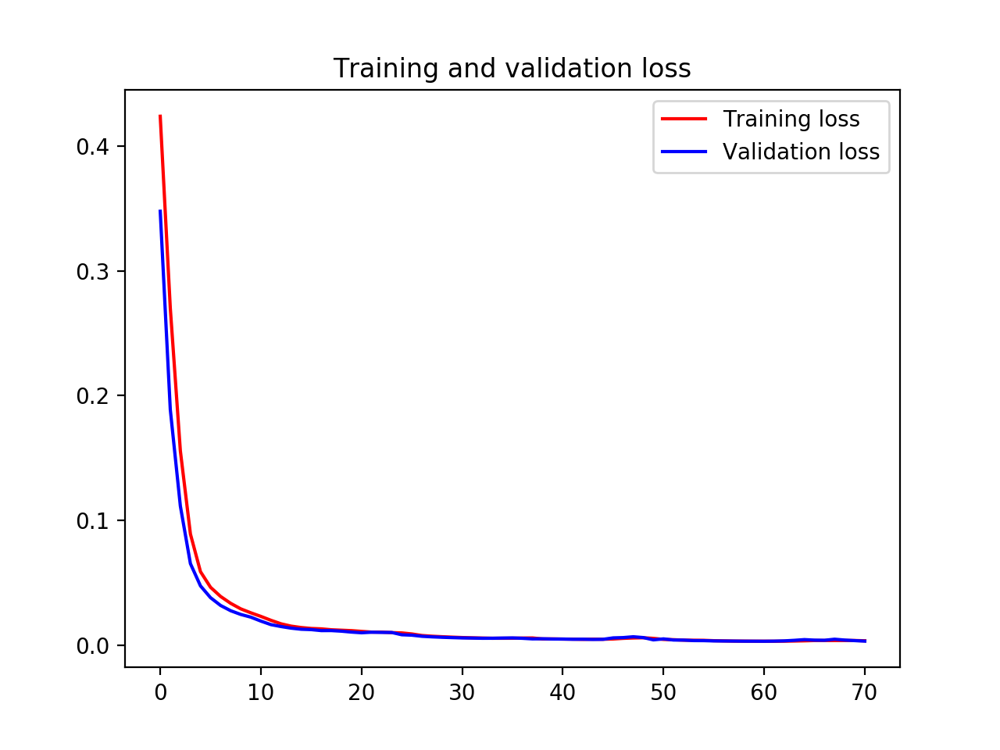

<IPython.core.display.Javascript object>


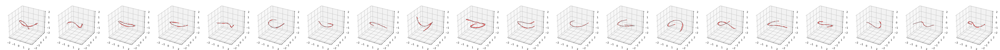

In [16]:
def autoEncoderRELU():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(300, activation='sigmoid')(x)
    x=Dense(200, activation='relu')(x)
    encoded=Dense(100, activation='relu')(x)

    # Decoding
    x=Dense(200, activation='relu')(encoded)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
AE,E,train_data =AE_analysis(autoEncoderRELU, 10, x_train, x_test, filename='RELU')
visualize_AE(AE, train_data, x_test)

## 1.3 Autoencoder LeakyRELU activation

Model no. 1
Restoring model weights from the end of the best epoch
Epoch 00069: early stopping
Model no. 2
Restoring model weights from the end of the best epoch
Epoch 00047: early stopping
Model no. 3
Restoring model weights from the end of the best epoch
Epoch 00053: early stopping
Model no. 4
Restoring model weights from the end of the best epoch
Epoch 00088: early stopping
Model no. 5
Restoring model weights from the end of the best epoch
Epoch 00039: early stopping
Model no. 6
Restoring model weights from the end of the best epoch
Epoch 00044: early stopping
Model no. 7
Restoring model weights from the end of the best epoch
Epoch 00038: early stopping
Model no. 8
Restoring model weights from the end of the best epoch
Epoch 00082: early stopping
Model no. 9
Restoring model weights from the end of the best epoch
Epoch 00060: early stopping
Model no. 10
Restoring model weights from the end of the best epoch
Epoch 00052: early stopping
[0.0044, 0.0067, 0.0059, 0.0036, 0.0071, 0.0074, 

<IPython.core.display.Javascript object>


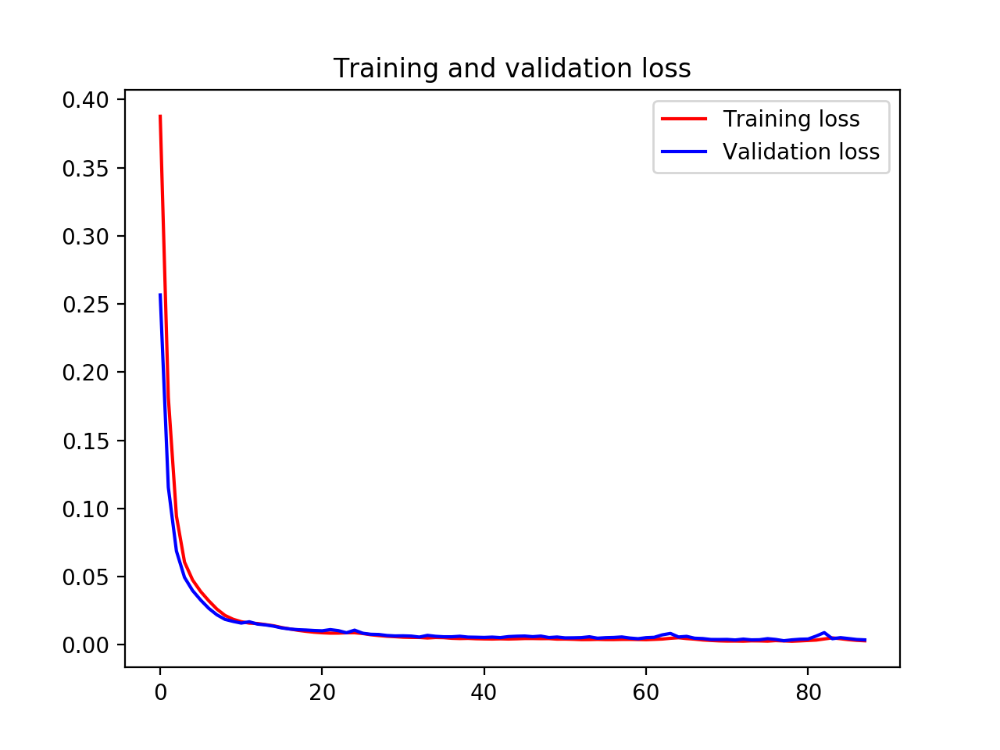

<IPython.core.display.Javascript object>


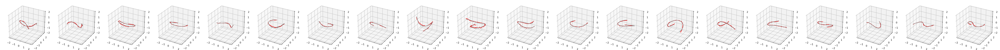

In [17]:
def autoEncoderLRELU():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(300)(x)
    x=LeakyReLU(alpha=0.01)(x)
    x=Dense(200)(x)
    x=LeakyReLU(alpha=0.01)(x)
    x=Dense(100)(x)
    encoded=LeakyReLU(alpha=0.01)(x)

    # Decoding
    x=Dense(200)(encoded)
    x=LeakyReLU(alpha=0.01)(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
AE,E,train_data =AE_analysis(autoEncoderLRELU, 10, x_train, x_test, filename='LRELU')
visualize_AE(AE, train_data, x_test)

# 2. Effect of Latent space Z=2,3,10,15,30,60,300 on Dense Auto-Encoders

The nodes in Z-space determines the dimensionity reduction carried out by an auto-encoder. However, if the z-space is too small, the accuracy of reconstruction is adversely affected. Thus, we carry an emperical analysis to find the best accuracy-dimentionality tradeoff.

| Z-Space Dimension   | Mean Validation Loss | Best Validation Loss |
|:-------------------:|:--------------------:|:--------------------:|
| 2                   | 0.1026               | 0.0492
| 3                   | 0.0693               | 0.0435
| 10                  | 0.0187               | 0.0148
| 15                  | 0.0156               | 0.0137
| 30                  | 0.0057               | 0.0038
| 60                  | 0.0027               | 0.0020
| 300                 | 0.0022               | 0.0019


Reconstruction losses for Z=2,3,10 are significant. However, we don't observe a lot of improvement in reconstructed results after Z=30. Thus, exploring architectures from Z=15 to Z=30 seems to be the sweet spot.

## 2.1 Autoencoder Z=2

Model no. 1
Restoring model weights from the end of the best epoch
Epoch 00106: early stopping
Model no. 2
Restoring model weights from the end of the best epoch
Epoch 00068: early stopping
Model no. 3
Restoring model weights from the end of the best epoch
Epoch 00132: early stopping
Model no. 4
Restoring model weights from the end of the best epoch
Epoch 00065: early stopping
Model no. 5
Restoring model weights from the end of the best epoch
Epoch 00230: early stopping
Model no. 6
Restoring model weights from the end of the best epoch
Epoch 00127: early stopping
Model no. 7
Restoring model weights from the end of the best epoch
Epoch 00066: early stopping
Model no. 8
Restoring model weights from the end of the best epoch
Epoch 00210: early stopping
Model no. 9
Restoring model weights from the end of the best epoch
Epoch 00146: early stopping
Model no. 10
Restoring model weights from the end of the best epoch
Epoch 00167: early stopping
[0.071, 0.1322, 0.0826, 0.1506, 0.0492, 0.1279, 0

<IPython.core.display.Javascript object>


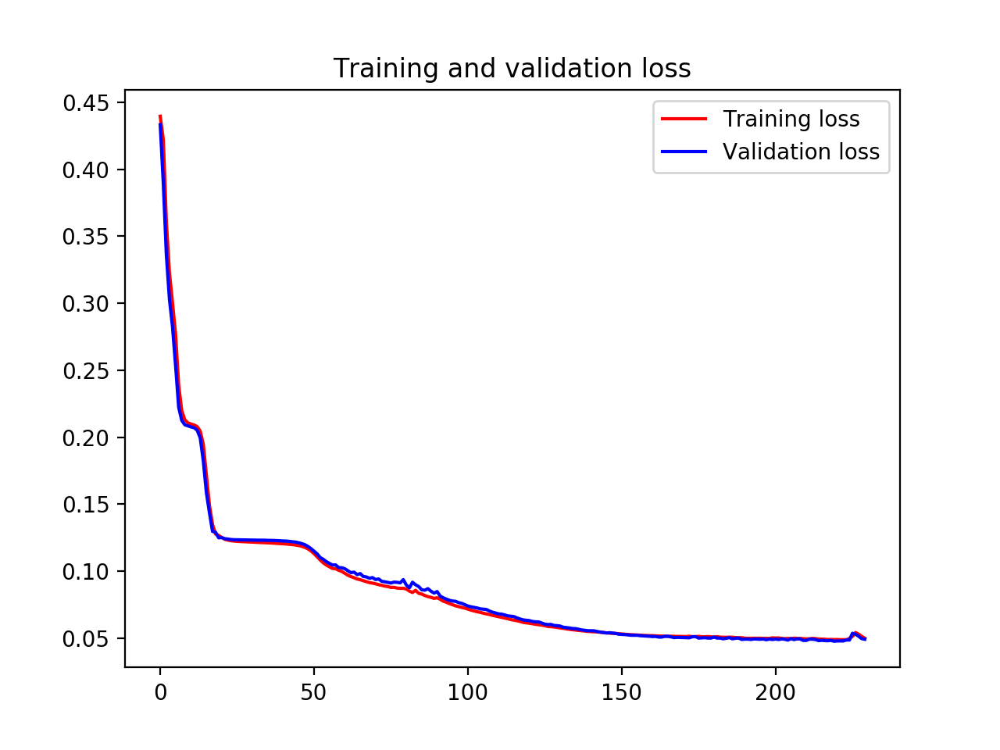

<IPython.core.display.Javascript object>


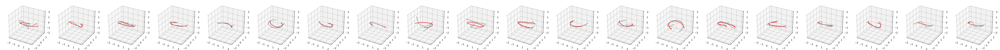

In [18]:
def autoEncoderZ2():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    x=Dense(30, activation='relu')(x)
    x=Dense(20, activation='relu')(x)
    x=Dense(10, activation='relu')(x)
    x=Dense(5, activation='relu')(x)
    encoded=Dense(2, activation='relu')(x)
    #encoded=Dense(10, activation='relu',activity_regularizer=regularizers.l1(10e-5))(x)

    # Decoding
    x=Dense(5, activation='relu')(encoded)
    x=Dense(10, activation='relu')(x)
    x=Dense(20, activation='relu')(x)
    x=Dense(30, activation='relu')(x)
    x=Dense(100, activation='relu')(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
AE,E,train_data =AE_analysis(autoEncoderZ2, 10, x_train, x_test, filename='Z2')
visualize_AE(AE, train_data, x_test)

## 2.2 Autoencoder Z=3

Model no. 1
Restoring model weights from the end of the best epoch
Epoch 00065: early stopping
Model no. 2
Restoring model weights from the end of the best epoch
Epoch 00183: early stopping
Model no. 3
Restoring model weights from the end of the best epoch
Epoch 00102: early stopping
Model no. 4
Restoring model weights from the end of the best epoch
Epoch 00230: early stopping
Model no. 5
Restoring model weights from the end of the best epoch
Epoch 00102: early stopping
Model no. 6
Restoring model weights from the end of the best epoch
Epoch 00190: early stopping
Model no. 7
Restoring model weights from the end of the best epoch
Epoch 00124: early stopping
Model no. 8
Restoring model weights from the end of the best epoch
Epoch 00143: early stopping
Model no. 9
Restoring model weights from the end of the best epoch
Epoch 00075: early stopping
Model no. 10
Restoring model weights from the end of the best epoch
Epoch 00237: early stopping
[0.1348, 0.0512, 0.0435, 0.0591, 0.0523, 0.0535, 

<IPython.core.display.Javascript object>


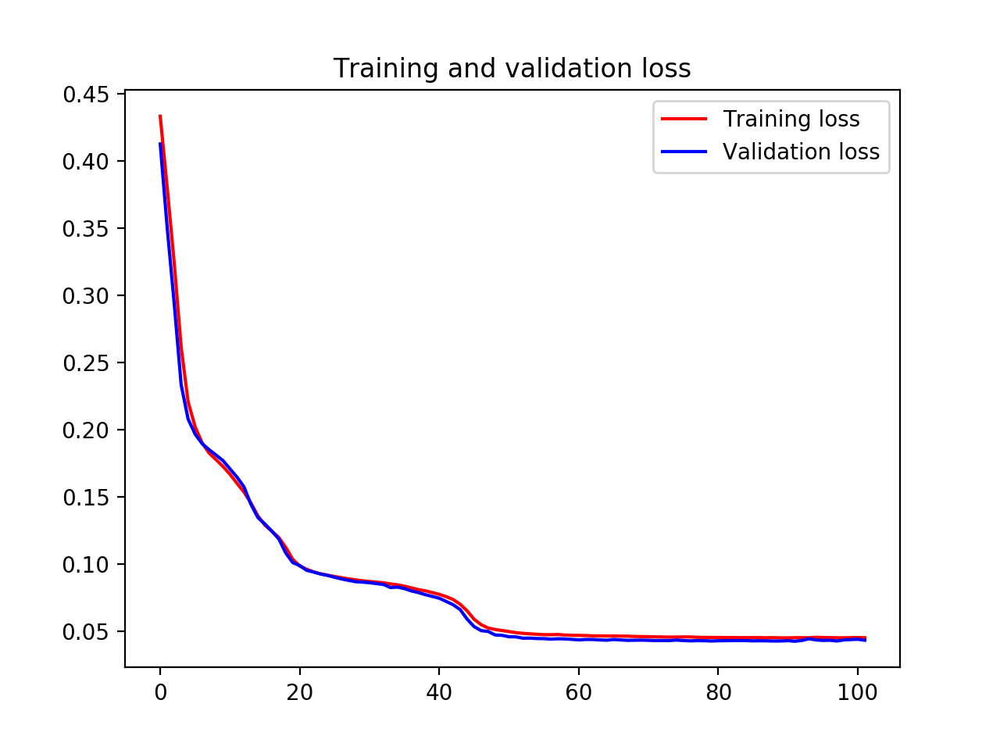

<IPython.core.display.Javascript object>


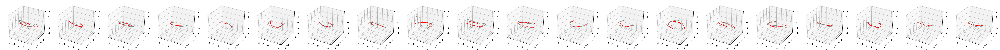

In [19]:
def autoEncoderZ3():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    x=Dense(30, activation='relu')(x)
    x=Dense(20, activation='relu')(x)
    x=Dense(10, activation='relu')(x)
    encoded=Dense(3, activation='relu')(x)
    #encoded=Dense(10, activation='relu',activity_regularizer=regularizers.l1(10e-5))(x)

    # Decoding
    x=Dense(10, activation='relu')(encoded)
    x=Dense(20, activation='relu')(x)
    x=Dense(30, activation='relu')(x)
    x=Dense(100, activation='relu')(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
AE,E,train_data =AE_analysis(autoEncoderZ3, 10, x_train, x_test, filename='Z3')
visualize_AE(AE, train_data, x_test)

## 2.3 Autoencoder Z=10

Model no. 1
Restoring model weights from the end of the best epoch
Epoch 00094: early stopping
Model no. 2
Restoring model weights from the end of the best epoch
Epoch 00131: early stopping
Model no. 3
Restoring model weights from the end of the best epoch
Epoch 00138: early stopping
Model no. 4
Restoring model weights from the end of the best epoch
Epoch 00084: early stopping
Model no. 5
Restoring model weights from the end of the best epoch
Epoch 00086: early stopping
Model no. 6
Restoring model weights from the end of the best epoch
Epoch 00096: early stopping
Model no. 7
Restoring model weights from the end of the best epoch
Epoch 00089: early stopping
Model no. 8
Restoring model weights from the end of the best epoch
Epoch 00152: early stopping
Model no. 9
Restoring model weights from the end of the best epoch
Epoch 00144: early stopping
Model no. 10
Restoring model weights from the end of the best epoch
Epoch 00103: early stopping
[0.0218, 0.0265, 0.0148, 0.016, 0.0202, 0.0181, 0

<IPython.core.display.Javascript object>


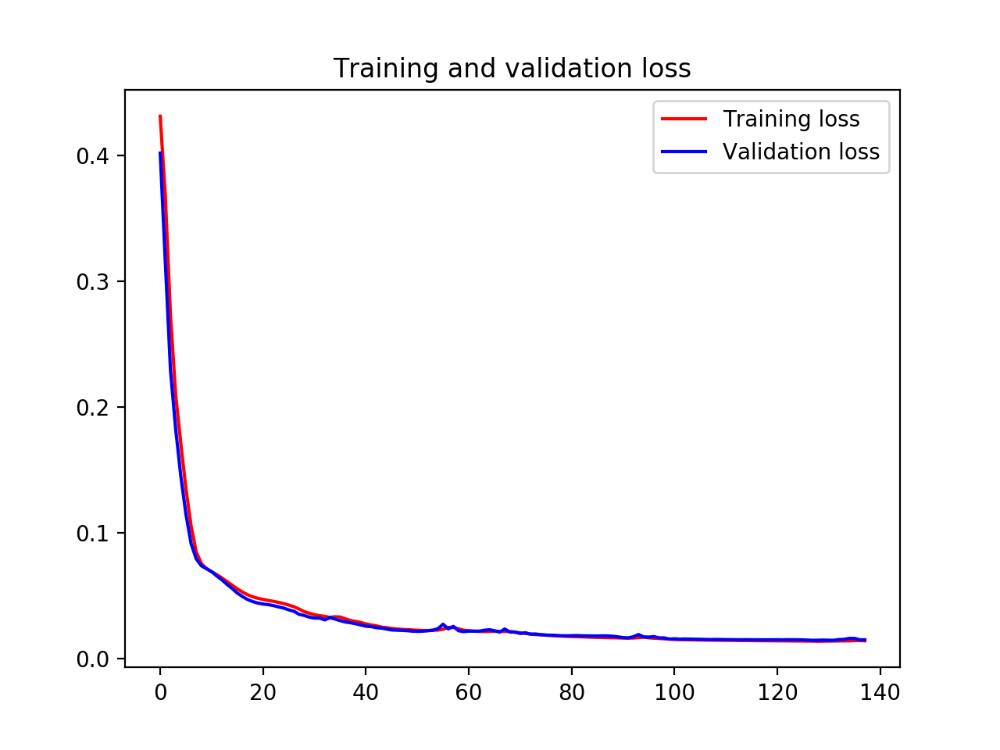

<IPython.core.display.Javascript object>


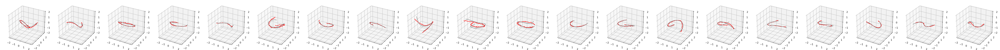

In [23]:
def autoEncoderZ10():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    x=Dense(50, activation='relu')(x)
    x=Dense(25, activation='relu')(x)
    encoded=Dense(10, activation='relu')(x)

    # Decoding
    x=Dense(25, activation='relu')(encoded)
    x=Dense(50, activation='relu')(x)
    x=Dense(100, activation='relu')(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
AE,E,train_data =AE_analysis(autoEncoderZ10, 10, x_train, x_test, filename='Z10')
visualize_AE(AE, train_data, x_test)

## 2.4 Autoencoder Z=15

Model no. 1
Restoring model weights from the end of the best epoch
Epoch 00128: early stopping
Model no. 2
Restoring model weights from the end of the best epoch
Epoch 00102: early stopping
Model no. 3
Restoring model weights from the end of the best epoch
Epoch 00074: early stopping
Model no. 4
Restoring model weights from the end of the best epoch
Epoch 00157: early stopping
Model no. 5
Restoring model weights from the end of the best epoch
Epoch 00100: early stopping
Model no. 6
Restoring model weights from the end of the best epoch
Epoch 00091: early stopping
Model no. 7
Restoring model weights from the end of the best epoch
Epoch 00083: early stopping
Model no. 8
Restoring model weights from the end of the best epoch
Epoch 00074: early stopping
Model no. 9
Restoring model weights from the end of the best epoch
Epoch 00085: early stopping
Model no. 10
Restoring model weights from the end of the best epoch
Epoch 00110: early stopping
[0.0137, 0.0151, 0.0155, 0.0141, 0.0177, 0.0157, 

<IPython.core.display.Javascript object>


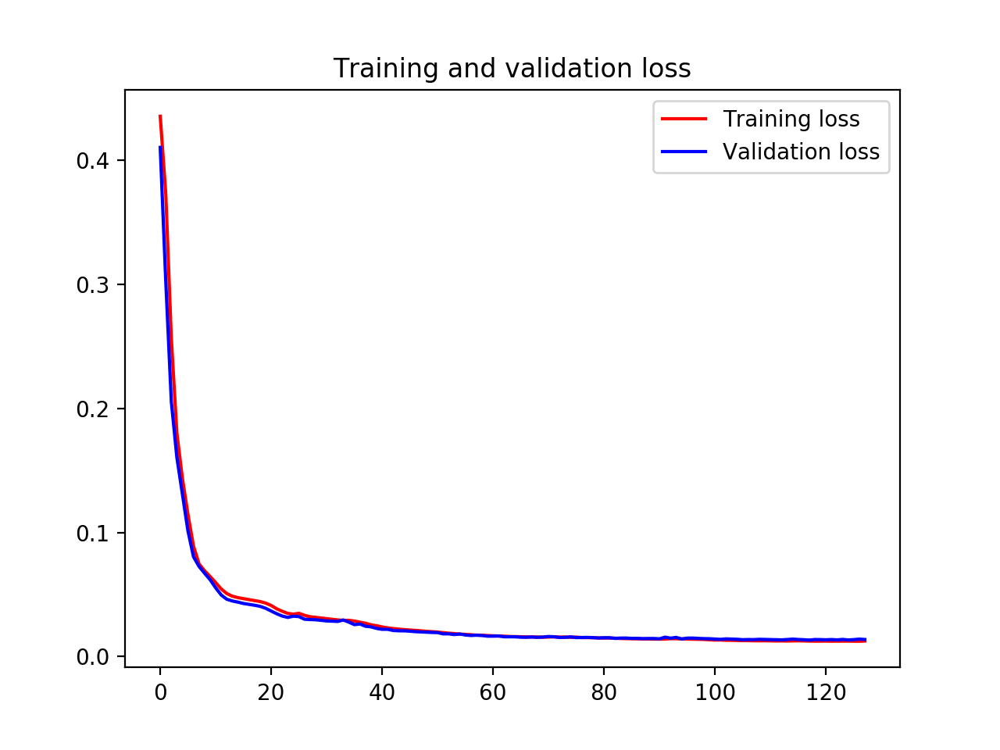

<IPython.core.display.Javascript object>


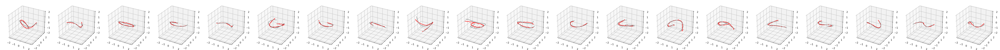

In [24]:
def autoEncoderZ15():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    x=Dense(60, activation='relu')(x)
    x=Dense(30, activation='relu')(x)
    encoded=Dense(15, activation='relu')(x)

    # Decoding
    x=Dense(30, activation='relu')(encoded)
    x=Dense(60, activation='relu')(x)
    x=Dense(100, activation='relu')(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
AE,E,train_data =AE_analysis(autoEncoderZ15, 10, x_train, x_test, filename='Z15')
visualize_AE(AE, train_data, x_test)

## 2.5 Autoencoder Z=30

Model no. 1
Restoring model weights from the end of the best epoch
Epoch 00127: early stopping
Model no. 2
Restoring model weights from the end of the best epoch
Epoch 00111: early stopping
Model no. 3
Restoring model weights from the end of the best epoch
Epoch 00117: early stopping
Model no. 4
Restoring model weights from the end of the best epoch
Epoch 00098: early stopping
Model no. 5
Restoring model weights from the end of the best epoch
Epoch 00193: early stopping
Model no. 6
Restoring model weights from the end of the best epoch
Epoch 00081: early stopping
Model no. 7
Restoring model weights from the end of the best epoch
Epoch 00162: early stopping
Model no. 8
Restoring model weights from the end of the best epoch
Epoch 00133: early stopping
Model no. 9
Restoring model weights from the end of the best epoch
Epoch 00106: early stopping
Model no. 10
Restoring model weights from the end of the best epoch
Epoch 00168: early stopping
[0.0051, 0.0056, 0.0079, 0.0065, 0.0038, 0.0068, 

<IPython.core.display.Javascript object>


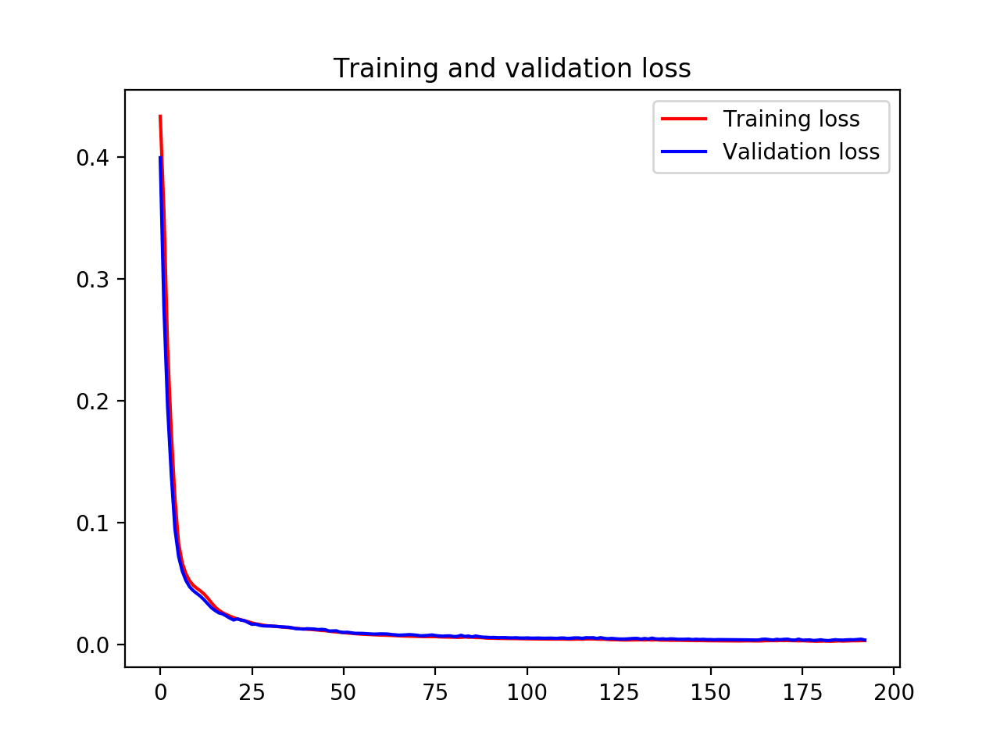

<IPython.core.display.Javascript object>


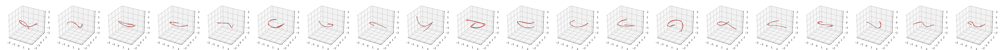

In [25]:
def autoEncoderZ30():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    x=Dense(60, activation='relu')(x)
    encoded=Dense(30, activation='relu')(x)

    # Decoding
    x=Dense(60, activation='relu')(encoded)
    x=Dense(100, activation='relu')(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
AE,E,train_data =AE_analysis(autoEncoderZ30, 10, x_train, x_test, filename='Z30')
visualize_AE(AE, train_data, x_test)

## 2.6 Autoencoder Z=60

Model no. 1
Restoring model weights from the end of the best epoch
Epoch 00129: early stopping
Model no. 2
Restoring model weights from the end of the best epoch
Epoch 00113: early stopping
Model no. 3
Restoring model weights from the end of the best epoch
Epoch 00130: early stopping
Model no. 4
Restoring model weights from the end of the best epoch
Epoch 00120: early stopping
Model no. 5
Restoring model weights from the end of the best epoch
Epoch 00153: early stopping
Model no. 6
Restoring model weights from the end of the best epoch
Epoch 00093: early stopping
Model no. 7
Restoring model weights from the end of the best epoch
Epoch 00088: early stopping
Model no. 8
Restoring model weights from the end of the best epoch
Epoch 00106: early stopping
Model no. 9
Restoring model weights from the end of the best epoch
Epoch 00107: early stopping
Model no. 10
Restoring model weights from the end of the best epoch
Epoch 00149: early stopping
[0.0023, 0.0029, 0.0024, 0.0028, 0.002, 0.003, 0.

<IPython.core.display.Javascript object>


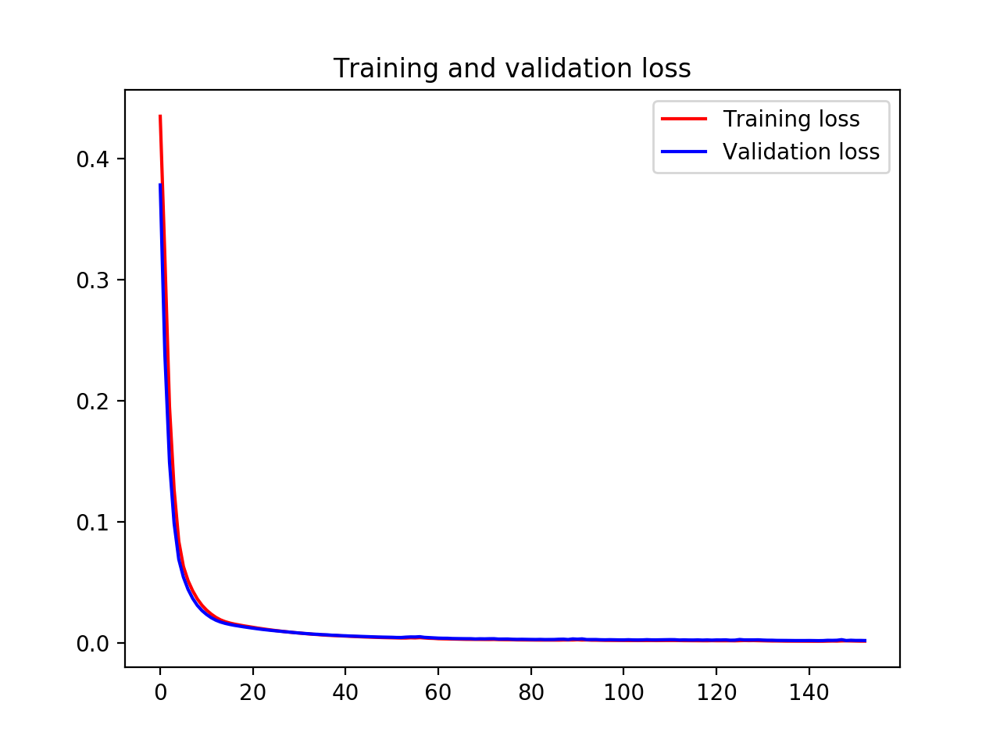

<IPython.core.display.Javascript object>


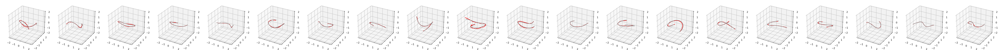

In [26]:
def autoEncoderZ60():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    encoded=Dense(60, activation='relu')(x)
    #encoded=Dense(10, activation='relu',activity_regularizer=regularizers.l1(10e-5))(x)

    # Decoding
    x=Dense(100, activation='relu')(encoded)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
AE,E,train_data =AE_analysis(autoEncoderZ60, 10, x_train, x_test, filename='Z60')
visualize_AE(AE, train_data, x_test)

## 2.7 AutoEncoder Z=300

Model no. 1
Restoring model weights from the end of the best epoch
Epoch 00070: early stopping
Model no. 2
Restoring model weights from the end of the best epoch
Epoch 00081: early stopping
Model no. 3
Restoring model weights from the end of the best epoch
Epoch 00062: early stopping
Model no. 4
Restoring model weights from the end of the best epoch
Epoch 00083: early stopping
Model no. 5
Restoring model weights from the end of the best epoch
Epoch 00066: early stopping
Model no. 6
Restoring model weights from the end of the best epoch
Epoch 00062: early stopping
Model no. 7
Restoring model weights from the end of the best epoch
Epoch 00050: early stopping
Model no. 8
Restoring model weights from the end of the best epoch
Epoch 00092: early stopping
Model no. 9
Restoring model weights from the end of the best epoch
Epoch 00084: early stopping
Model no. 10
Restoring model weights from the end of the best epoch
Epoch 00083: early stopping
[0.0023, 0.0021, 0.0022, 0.0021, 0.0022, 0.0025, 

<IPython.core.display.Javascript object>


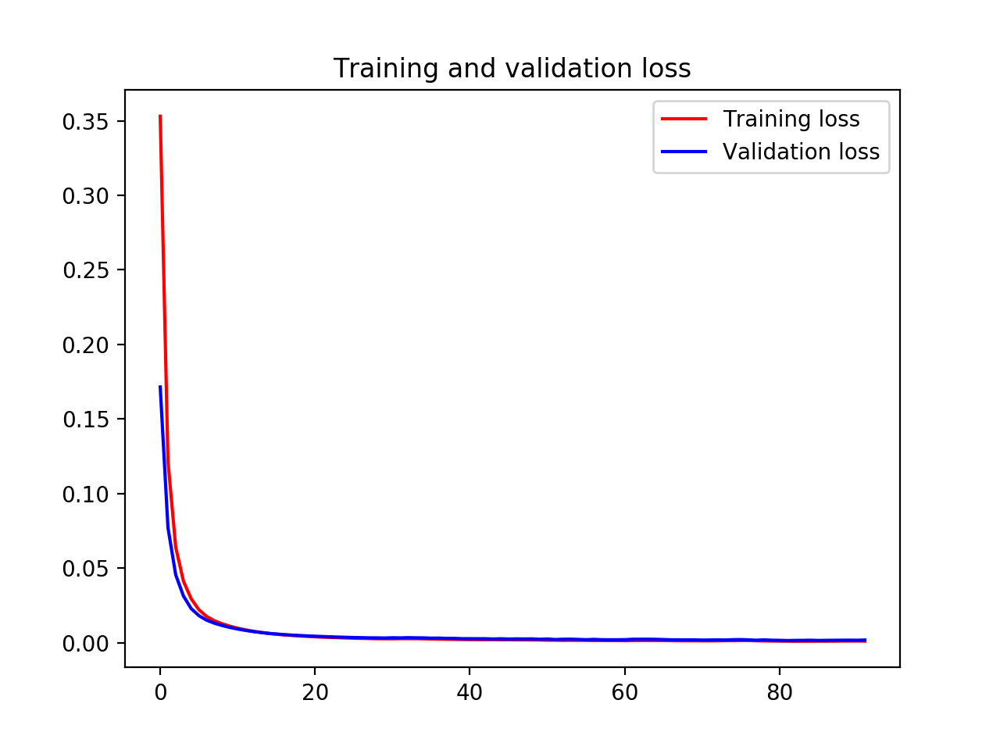

<IPython.core.display.Javascript object>


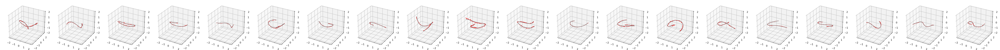

In [27]:
def autoEncoderZ300():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(300, activation='relu')(x)
    encoded=Dense(300, activation='relu')(x)
    #encoded=Dense(10, activation='relu',activity_regularizer=regularizers.l1(10e-5))(x)

    # Decoding
    x=Dense(300)(encoded)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
AE,E,train_data =AE_analysis(autoEncoderZ300, 10, x_train, x_test, filename='Z300')
visualize_AE(AE, train_data, x_test)